---
title: "Flow Matching"
author: "Mark Fuge"
date: "November 9 2025"
format:
    html:
        code-fold: true
        code-summary: "Show Code"
---

In the previous chapters, we explored how Denoising Score Matching and Diffusion Models can learn to reverse a stochastic (noise-based) process to generate data. These models gradually destroy structure with noise and then learn to painstakingly reverse that process, step by noisy step.

This raises a question: **Can we achieve the same goal without noise?** What if we could learn a deterministic transformation that smoothly 'flows' a simple base distribution (like a Gaussian) into a complex data distribution? 

This is the core idea behind **Flow Matching**. Instead of learning to reverse a noisy, stochastic process, we learn a deterministic vector field of velocities that directly transports probability mass. We saw this ideas earlier in two cases: first with Optimal Transport GANs, where we had to solve a complex and expensive transport matching problem, and then later with (Continuous) Normalizing Flows, which required computing Jacobian determinants in high dimensions. Flow Matching inherits some of these ideas -- notably the idea of learning a vector field to move data points from CNFs and the notion of pairing sets of points from Optimal Transport -- but avoids many of their computational complexities by making certain approximations. In practice, this approach is often simpler to train, faster to sample from, and offers a different but powerful perspective on generative modeling that those we have looked at so far.

## Learning Objectives

By the end of this notebook, you should have a strong intuition for:

- The conceptual difference between stochastic diffusion and deterministic flow matching.
- How to define a simple 'path' between a noise distribution and a data distribution.
- How to train a neural network to predict the 'velocity' along this path.
- How to generate samples by integrating this learned velocity field using an ODE solver.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch import nn
import torch.optim as optim
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

from gen_models_utilities import (
    device,
    create_ring_gaussians, 
    make_loader, 
    load_eth_z_logo_data,
    make_conditional_loader_onehot,
    make_conditional_loader_radius,
    plot_conditional_samples_discrete,
    plot_conditional_samples_continuous
)

# Use a consistent style
plt.style.use('seaborn-v0_8-muted')
sns.set_context('talk')

# for reproducibility
torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

#device = "cpu"
print(f'Using device: {device}')

Using device: cuda


## The Noise-Free Limit

As we saw last chapter, Diffusion models work by reversing a stochastic process. The sampling is noisy and requires many steps because it has to undo the randomness that was added during the forward process. 

Flow matching takes a more direct route. It learns a deterministic vector field $v_\theta(x_t, t)$ that defines the velocity of particles as they move from a base distribution $p_0$ to the target data distribution $p_1$. The generative process becomes the solution to an ordinary differential equation (ODE):

$$ \frac{dx_t}{dt} = v_\theta(x_t, t) $$

Starting with a sample $x_0 \sim p_0$, we can find the corresponding data sample $x_1$ by integrating this equation from $t=0$ to $t=1$. The path is smooth and deterministic. This is similar in concept to what we saw in the previous chapter on Continuous Normalizing Flows (CNFs), however, we will see below that they have different training strategies and properties. 

## Interpolating a Path

Like with CNFs, we need to define a velocity field $v_\theta(x_t, t)$ that smoothly transports samples from the base distribution to the data distribution over time. But how should we define the 'correct' velocity field to learn? In CNFs, we derived it from the instantaneous change of variables formula, but that required computing Jacobian determinants which can be expensive and required the velocity field to have certain regularity properties so that the integral could be computed efficiently. Moreover, training the velocity field required estimating an integral over the entire flow path, which can be computationally intensive, and the numerical ODE solver used to compute the integral had to be differentiable to allow backpropagation back to the learned velocity field.

In contrast, Flow Matching uses a simple but brilliant trick. We don't need to simulate a complex forward process (as in Diffusion Models) or estimate some integral of a flow path (as in CNFs). Instead, we just define a synthetic 'path' by simply drawing a straight line between a sample from our base distribution and a sample from our data distribution. This pair of samples is often called a **synthetic coupling pair**.

Let $x_0 \sim p_\text{base}$ (e.g., a standard Gaussian) and $x_1 \sim p_\text{data}$ (e.g., our ring of Gaussians). Given these two sampled points, we define an interpolated point $x_t$ at time $t \in [0, 1]$ as:

$$ x_t = (1 - t) x_0 + t x_1 $$

This gives us a point on the straight line connecting the noise sample to the data sample. The velocity along this path is constant and easy to calculate:

$$ v_t(x_t) = \frac{dx_t}{dt} = x_1 - x_0 $$

This is our **ground truth** velocity. For any interpolated point $x_t$, the target vector is simply the difference vector between the data point and the noise point that created it. This provides a direct, local supervision signal for training our neural network. Another nice benefit of this approach is that it doesn't place any particular restrictions on the base distribution -- it can be Gaussian, uniform, or any other simple distribution from which we can easily sample, since all we need are coupled pairs of points $(x_0, x_1)$ to define our paths. That is, Flow Matching doesn't require any specific form for $p_\text{base}$, unlike models such as Diffusion Models that assume (and in fact rely upon) on Gaussian noise to be the final base distribution.

To understand what this synthetic coupling means, let's visualize these straight-line paths.

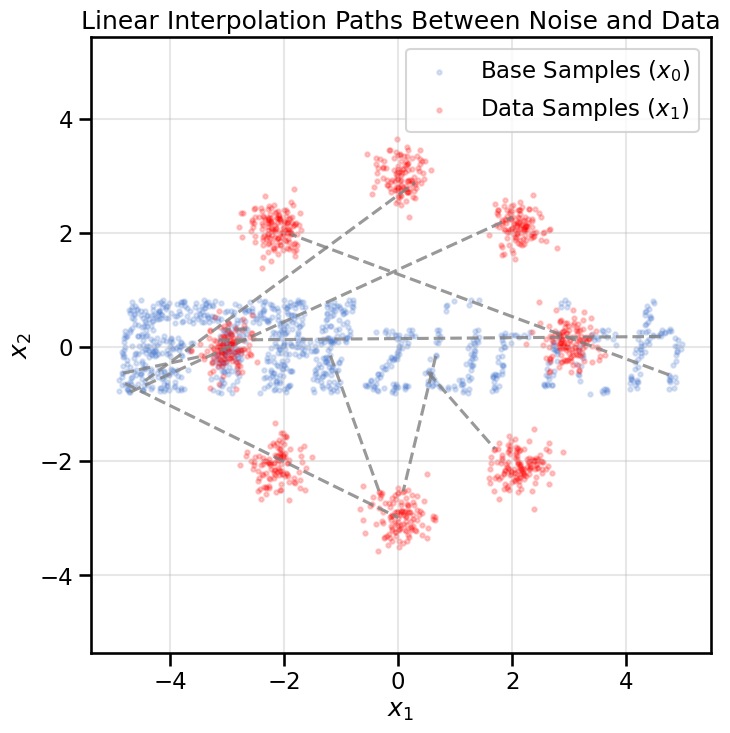

In [2]:

# Load data
data, labels = create_ring_gaussians(n_samples=1000)

BASE_DISTRIBUTION = 'ethz_logo'  # Options: 'gaussian', 'uniform', 'ethz_logo'
# Sample from base distribution
if BASE_DISTRIBUTION == 'gaussian':
    x0_samples = torch.randn(data.shape[0], 2)
elif BASE_DISTRIBUTION == 'uniform':
    x0_samples = torch.rand(data.shape[0], 2)*7.0 - 3.5  # Uniform noise in [-3.5, 3.5]
elif BASE_DISTRIBUTION == 'ethz_logo':
    x0_samples = load_eth_z_logo_data(n_samples=data.shape[0])

# Take a small subset to visualize
n_viz = 10
x0_viz = x0_samples[:n_viz]
x1_viz = torch.from_numpy(data[:n_viz]).float()

plt.figure(figsize=(8, 8))
plt.scatter(x0_samples[:, 0], x0_samples[:, 1], s=10, alpha=0.2, label='Base Samples ($x_0$)')
plt.scatter(data[:, 0], data[:, 1], s=10, alpha=0.2, color='red', label='Data Samples ($x_1$)')

# Draw lines connecting pairs
for i in range(n_viz):
    plt.plot([x0_viz[i, 0], x1_viz[i, 0]], [x0_viz[i, 1], x1_viz[i, 1]], color='gray', linestyle='--', alpha=0.8)

plt.title('Linear Interpolation Paths Between Noise and Data')
plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.axis('equal')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

Each dashed line represents a simple path from a noise sample to a data sample. Our goal is to train a vector field that will push particles along these kinds of paths.

::: {.callout-note collapse="true"}
### Why pick the pairs of points randomly?

It may first seem odd to randomly pair points from the base and data distributions. Why not try to find the 'best' matching pairs, as we did earlier when we covered Optimal Transport? In that chapter, we saw that by computing the optimal transport map, we could minimize the total cost of moving probability mass, which also seems like it would be useful in flow matching and lead to better paths. One major downside of Optimal Transport is that finding the optimal matching can be computationally expensive, especially in high dimensions or with large datasets. Flow Matching sidesteps this complexity by using completely random pairings as we can see above.

But why should this work? Does a velocity field trained on random pairings still learn to transport mass correctly from the base to the data distribution?

This was the main insight from the [original Flow Matching paper by Lipman et al. (2022)](https://arxiv.org/abs/2210.02747). They showed (see Appendix A) that even with random pairings, the *expected* velocity field learned over many such random pairs still approximates the *true* optimal transport interpolant needed to move mass from the base to the data distribution. Intuitively, while any single random pairing may not represent an optimal path, averaging over many such paths provides a good approximation of the overall flow needed to transform one distribution into the other. Of course, you could also use more sophisticated pairing strategies, such as actually computing the optimal transport coupling, but what was impressive about the original Flow Matching paper was that the random pairing approach is simple, efficient, and works surprisingly well in practice.

:::

## Training via Velocity Regression

The training objective for Flow Matching is a straightforward regression problem. We want our neural network $v_\theta(x_t, t)$ to predict the true velocity, $x_1 - x_0$, and the loss function is a simple Mean Squared Error:

$$
L(\theta) = \mathbb{E}_{t, x_0, x_1} \left[ \left\| v_\theta((1-t)x_0 + t x_1, t) - (x_1 - x_0) \right\|^2 \right]
$$

This is even simpler than the diffusion model objective. There are no noise schedules ($\alpha_t$, $\beta_t$) to worry about.

### The Training Pipeline

The training process for each step is as follows:

1.  **Sample a Pair:** Pick a noise sample $x_0$ at random from the base distribution and a data sample $x_1$ at random from the training data.
2.  **Sample Time:** Pick a random timestep $t$ uniformly from $[0, 1]$.
3.  **Interpolate:** Compute the point on the path: $x_t = (1-t)x_0 + t x_1$.
4.  **Compute Target Velocity:** The target is simply $v_{target} = x_1 - x_0$.
5.  **Predict Velocity:** Feed $x_t$ and $t$ into the neural network $v_\theta(x_t, t)$ to get the predicted velocity.
6.  **Compute Loss:** Calculate the Mean Squared Error between the network's prediction and the target velocity.
7.  **Update:** Backpropagate and update the network's weights.

Let's implement this. The network architecture will be very similar to the one we used for our diffusion model, as it also needs to be conditioned on time.

Epoch 0, Loss: 9.1081
Epoch 50, Loss: 6.0522
Epoch 100, Loss: 4.8192
Epoch 150, Loss: 4.7758
Epoch 200, Loss: 4.6283
Epoch 250, Loss: 4.2880
Epoch 300, Loss: 3.9641
Epoch 350, Loss: 4.1624
Epoch 400, Loss: 3.8411
Epoch 450, Loss: 4.2785
Epoch 500, Loss: 4.0259
Epoch 550, Loss: 3.9824
Epoch 600, Loss: 4.0530
Epoch 650, Loss: 4.0388
Epoch 700, Loss: 4.2475
Epoch 750, Loss: 3.7330
Epoch 800, Loss: 3.9644
Epoch 850, Loss: 3.7940
Epoch 900, Loss: 4.2690
Epoch 950, Loss: 3.9338
Epoch 1000, Loss: 3.8900
Epoch 1050, Loss: 3.8017
Epoch 1100, Loss: 3.8478
Epoch 1150, Loss: 3.8510
Epoch 1200, Loss: 3.7722
Epoch 1250, Loss: 3.6503
Epoch 1300, Loss: 3.8214
Epoch 1350, Loss: 3.8547
Epoch 1400, Loss: 3.3953
Epoch 1450, Loss: 3.7348
Epoch 1500, Loss: 3.6998
Epoch 1550, Loss: 3.5748
Epoch 1600, Loss: 3.8926
Epoch 1650, Loss: 3.7013
Epoch 1700, Loss: 3.9276
Epoch 1750, Loss: 3.6276
Epoch 1800, Loss: 3.7231
Epoch 1850, Loss: 3.7062
Epoch 1900, Loss: 3.6872
Epoch 1950, Loss: 4.0305
Epoch 2000, Loss: 3.890

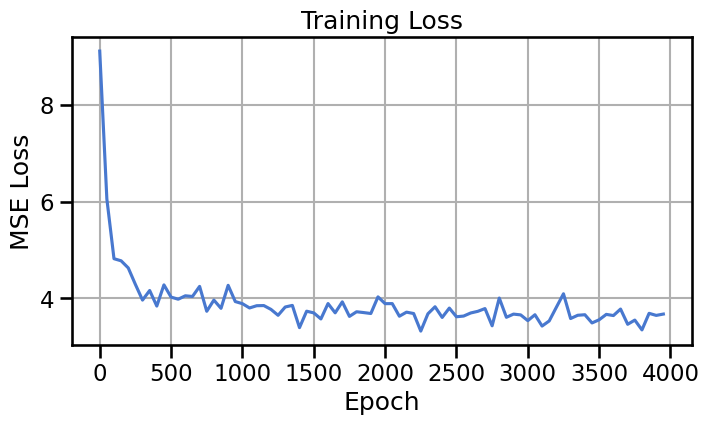

In [3]:
#| code-fold: false
# Time-conditional network to predict velocity
class VelocityField(nn.Module):
    def __init__(self, time_emb_dim=16, hidden_dim=128):
        super().__init__()
        # We can't use an embedding layer for continuous time, so we'll use a small MLP
        self.time_mlp = nn.Sequential(
            nn.Linear(1, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim)
        )
        self.net = nn.Sequential(
            nn.Linear(2 + time_emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2) # Predicts the velocity vector
        )

    def forward(self, x, t):
        # t is expected to be of shape [batch_size, 1]
        t_emb = self.time_mlp(t)
        x_in = torch.cat([x, t_emb], dim=-1)
        return self.net(x_in)

# Training parameters
lr = 1e-3
if BASE_DISTRIBUTION == 'ethz_logo':
    n_epochs = 4000
else:
    n_epochs = 500
batch_size = 1000
loader = make_loader(data, batch_size=batch_size)

# Model and optimizer
flow_model = VelocityField().to(device)
optimizer = optim.AdamW(flow_model.parameters(), lr=lr)

# Training loop
losses = []
for epoch in range(n_epochs):
    for (x1_batch,) in loader:
        x1 = x1_batch.to(device)
        
        # 1. Sample noise
        if BASE_DISTRIBUTION == 'gaussian':
            x0 = torch.randn_like(x1)
        elif BASE_DISTRIBUTION == 'uniform':
            x0 = torch.rand_like(x1)*7.0 - 3.5  # Uniform noise in [-3.5, 3.5]
        elif BASE_DISTRIBUTION == 'ethz_logo':
            x0 = torch.Tensor(load_eth_z_logo_data(n_samples=x1.shape[0]))
        x0 = x0.to(device)
        
        # 2. Sample time
        t = torch.rand(x1.shape[0], 1, device=device)
        
        # 3. Interpolate
        xt = (1 - t) * x0 + t * x1
        
        # 4. Compute target velocity
        target_v = x1 - x0
        
        # 5. Predict velocity
        predicted_v = flow_model(xt, t)
        
        # 6. Compute loss
        loss = nn.functional.mse_loss(predicted_v, target_v)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    
    if epoch % 50 == 0:
        losses.append(loss.item())
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

print("Training complete.")

# Plot the loss curve
plt.figure(figsize=(8, 4))
plt.plot(range(0, n_epochs, 50), losses)
plt.title("Training Loss")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.grid(True)
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


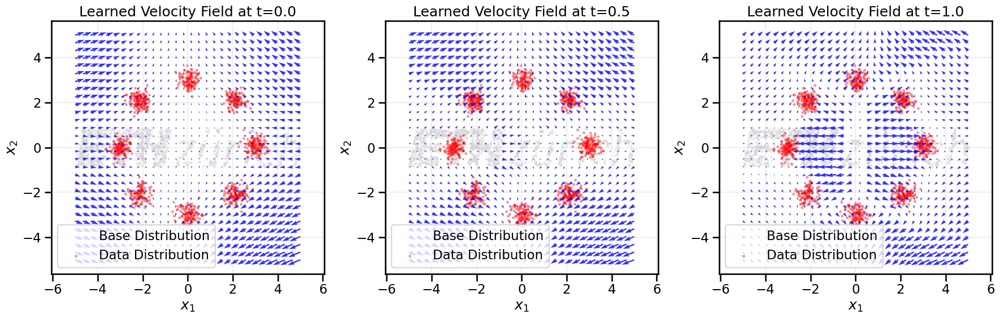

In [4]:
# Visualize the learned velocity field
xx, yy = np.meshgrid(np.linspace(-5, 5, 30), np.linspace(-5, 5, 30))
grid_points = torch.tensor(np.stack([xx.ravel(), yy.ravel()], axis=1), dtype=torch.float32, device=device)

# Get the velocity at each grid point at different times
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
times_to_viz = [0.0, 0.5, 1.0]

for idx, t_val in enumerate(times_to_viz):
    ax = axes[idx]
    
    # Create time tensor
    t_grid = torch.full((grid_points.shape[0], 1), t_val, device=device)
    
    # Get velocity predictions
    flow_model.eval()
    with torch.no_grad():
        velocities = flow_model(grid_points, t_grid).cpu().numpy()
    
    # Plot base distribution samples in light grey
    if BASE_DISTRIBUTION == 'gaussian':
        base_samples = np.random.randn(1000, 2)
    elif BASE_DISTRIBUTION == 'uniform':
        base_samples = np.random.rand(1000, 2)*7.0 - 3.5  # Uniform noise in [-3.5, 3.5]
    elif BASE_DISTRIBUTION == 'ethz_logo':
        base_samples = load_eth_z_logo_data(n_samples=1000)

    ax.scatter(base_samples[:, 0], base_samples[:, 1], s=5, color='lightgrey', alpha=0.3, label='Base Distribution')
    
    # Plot data samples in red
    ax.scatter(data[:, 0], data[:, 1], s=5, color='red', alpha=0.3, label='Data Distribution')
    
    # Plot velocity field
    ax.quiver(grid_points[:, 0].cpu(), grid_points[:, 1].cpu(), 
              velocities[:, 0], velocities[:, 1], 
              color='blue', width=0.005, alpha=0.8)
    
    ax.set_title(f'Learned Velocity Field at t={t_val:.1f}')
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.axis('equal')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.grid(True, alpha=0.2)
    ax.legend()

plt.tight_layout()
plt.show()

In [5]:
def animate_velocity_field(model, grid_points, data, times=None, skip=1):
    """Create an inline animation of the learned velocity field over time.

    model: a time-conditional velocity model taking (x, t) -> v
    grid_points: torch tensor of shape [N, 2] with points where to evaluate the field
    data: numpy array of data samples for background plotting
    times: 1D array-like of time values in [0,1]. If None, uses 101 steps.
    skip: sample every `skip` frames for the animation to speed it up.
    """
    if times is None:
        times = np.linspace(0.0, 1.0, 101)
    times = np.asarray(times)

    model.eval()
    xx = grid_points[:, 0].cpu().numpy()
    yy = grid_points[:, 1].cpu().numpy()

    fig, ax = plt.subplots(figsize=(6, 6))

    def update(i):
        ax.clear()
        t_val = float(times[i])
        t_grid = torch.full((grid_points.shape[0], 1), t_val, device=device)
        with torch.no_grad():
            v = model(grid_points, t_grid).cpu().numpy()

        # Background: data samples in red
        ax.scatter(data[:, 0], data[:, 1], s=5, color='red', alpha=0.3)

        # Quiver plot of velocity field
        ax.quiver(xx, yy, v[:, 0], v[:, 1], color='blue', width=0.005, alpha=0.9)
        ax.set_title(f'Learned Velocity Field — t={t_val:.3f}')
        ax.set_xlim(-5, 5)
        ax.set_ylim(-5, 5)
        ax.set_xlabel('$x_1$')
        ax.set_ylabel('$x_2$')
        ax.set_aspect('equal', adjustable='box')
        ax.grid(True, alpha=0.2)

    frames = range(0, len(times), max(1, skip))
    ani = FuncAnimation(fig, update, frames=frames, repeat=False, interval=80)
    plt.close(fig)
    return HTML(ani.to_jshtml())

# Default call: show a 101-frame animation (sample every 2 frames to speed up)
animate_velocity_field(flow_model, grid_points, data, times=np.linspace(0, 1, 101), skip=2)

## Generating Samples by Solving the ODE

Once the velocity field $v_\theta(x, t)$ is trained, we can generate samples by solving the initial value problem defined by our ODE. We start with a random sample from the base distribution, $x_0 \sim \mathcal{N}(0, I)$, and integrate the velocity field from $t=0$ to $t=1$:

$$
x_1 = x_0 + \int_0^1 v_\theta(x_t, t) dt
$$

In practice, we use a numerical ODE solver to approximate this integral. A simple choice is the **Euler method**, where we take small, discrete steps in time:

$$
x_{t + \Delta t} = x_t + v_\theta(x_t, t) \Delta t
$$

We repeat this process from $t=0$ to $t=1$ to get our final sample. More sophisticated solvers like Runge-Kutta (RK4) can provide more accurate solutions with fewer steps.

Let's implement a simple Euler integrator and use it to generate samples. We will animate the process to see the smooth, deterministic flow from noise to data.

In [6]:
#| code-fold: false
@torch.no_grad()
def generate_with_ode_solver(model, n_samples=500, n_steps=100, initial_noise_scale=1.0):
    """Generate samples by solving the ODE with Euler's method.
        Note here that unlike in CNFs, we don't require the ODE solver to be
        differentiable, because we are only using it for sampling points not training.
    """
    model.eval()
    
    # Start with pure noise
    if BASE_DISTRIBUTION == 'gaussian':
        x = torch.randn(n_samples, 2, device=device) * initial_noise_scale
    elif BASE_DISTRIBUTION == 'uniform':
        x = torch.rand(n_samples, 2, device=device)*7.0 - 3.5
    elif BASE_DISTRIBUTION == 'ethz_logo':
        x = torch.tensor(load_eth_z_logo_data(n_samples=n_samples), dtype=torch.float32, device=device)
    
    # Store trajectory for animation
    trajectory = [x.cpu().numpy()]
    
    dt = 1. / n_steps
    
    for i in range(n_steps):
        t = torch.full((n_samples, 1), i / n_steps, device=device)
        
        # Predict velocity
        v = model(x, t)
        
        # Euler step
        x = x + v * dt
        
        trajectory.append(x.cpu().numpy())
        
    return x.cpu().numpy(), np.array(trajectory)

# Generate samples and their trajectories
generated_samples_flow, trajectory_flow = generate_with_ode_solver(flow_model, n_samples=1000, n_steps=500)


In [7]:

# Create the animation
fig, ax = plt.subplots(figsize=(8, 8))

def update_flow(frame):
    ax.clear()
    
    # Plot the target distribution in the background
    #sns.kdeplot(x=data[:, 0], y=data[:, 1], cmap="viridis", fill=True, alpha=0.3, ax=ax, levels=15)
    ax.scatter(data[:, 0], data[:, 1], s=5, color='lightgrey', alpha=0.5)

    # Plot the current state of the samples
    current_samples = trajectory_flow[frame]
    ax.scatter(current_samples[:, 0], current_samples[:, 1], s=10, color='red', alpha=0.8)
    
    ax.set_title(f"Flow Matching: Step {frame}/{trajectory_flow.shape[0]-1}")
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    #ax.axis('equal')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.grid(True, alpha=0.2)

# Create and display the animation
skip_frames = 10
frames = range(0, trajectory_flow.shape[0], skip_frames)
ani_flow = FuncAnimation(fig, update_flow, frames=frames, 
                         repeat=False, interval=50)
plt.close(fig) # Prevent static plot from showing
HTML(ani_flow.to_jshtml())

The animation shows the smooth, deterministic paths the samples take as they are pushed by the learned velocity field. Unlike the stochastic, zig-zagging paths of the diffusion sampler, these particles flow directly and efficiently toward the target distribution.

## Conditional Generation with Flow Matching

As with diffusion models, Flow Matching can be extended to conditional generation tasks. By conditioning the velocity field on additional information (like class labels or text embeddings), we can guide the flow to generate samples that match specific conditions. For example, if we want to generate images of specific classes, we can modify our velocity network to take an additional input representing the class label. During training, we would sample pairs of points $(x_0, x_1)$ along with their corresponding class labels and train the network to predict the velocity conditioned on these labels. Likewise, during sampling, we would start with a noise sample and integrate the ODE while providing the desired condition to the velocity network at each step. 

Below, we will repeat our earlier exercises on conditional generation, this time using Flow Matching instead of Diffusion Models. As before, we will first train on a discrete set of classes (the ring of Gaussians) and note how the learned flow fields change as we modify the conditioning label. Then we will show a continuous conditioning example, where we condition on a continuous variable (the radius) to show how flow matching can condition on continuous variables.

In [8]:
#| code-fold: false
class ConditionalVelocityField(nn.Module):
    """Velocity field conditioned on one-hot encoded mode labels."""

    def __init__(self, n_classes=8, time_emb_dim=16, hidden_dim=128):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.Linear(1, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim),
        )
        # Concatenate: x (2) + time_emb (time_emb_dim) + one_hot (n_classes)
        self.net = nn.Sequential(
            nn.Linear(2 + time_emb_dim + n_classes, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2),
        )

    def forward(self, x, t, c):
        """
        Args:
            x: [batch, 2] - spatial coordinates
            t: [batch, 1] - time
            c: [batch, n_classes] - one-hot encoded class labels
        """
        t_emb = self.time_mlp(t)
        x_in = torch.cat([x, t_emb, c], dim=-1)
        return self.net(x_in)


def train_conditional_flow_onehot(
    data, labels, n_epochs=500, batch_size=128, lr=1e-3, n_classes=8
):
    """Train the conditional velocity field with one-hot conditioning.
    """

    # Create conditional data loader
    cond_loader = make_conditional_loader_onehot(
        data=data, labels=labels, batch_size=batch_size, n_classes=n_classes
    )

    # Model and optimizer
    model = ConditionalVelocityField(n_classes=8).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr)

    # Training loop
    losses = []
    for epoch in range(n_epochs):
        epoch_loss = 0.0
        n_batches = 0
        for x1_batch, labels_batch in cond_loader:
            x1 = x1_batch.to(device)
            c = labels_batch.to(device)

            # Sample noise
            x0 = torch.randn_like(x1)

            # Sample time
            t = torch.rand(x1.shape[0], 1, device=device)

            # Interpolate
            xt = (1 - t) * x0 + t * x1

            # Compute target velocity
            target_v = x1 - x0

            # Predict velocity with conditioning
            predicted_v = model(xt, t, c)

            # Compute loss
            loss = nn.functional.mse_loss(predicted_v, target_v)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            n_batches += 1

        avg_loss = epoch_loss / n_batches
        losses.append(avg_loss)

        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {avg_loss:.4f}")

    print("Conditional training complete.")

    # Plot the loss curve
    plt.figure(figsize=(8, 4))
    plt.plot(range(n_epochs), losses)
    plt.title("Conditional Flow Matching Training Loss (One-Hot)")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.grid(True)
    plt.show()

    return model


@torch.no_grad()
def sample_conditional_flow(model, condition, n_samples=100, n_steps=100):
    """Generate samples using conditional flow matching.

    Args:
        model: Conditional velocity field model
        condition: [batch, n_classes] one-hot encoded condition
        n_samples: Number of samples to generate
        n_steps: Number of ODE integration steps
    """
    model.eval()

    # Start with pure noise
    x = torch.randn(n_samples, 2, device=device)

    # Expand condition to match batch size
    c = condition.repeat(n_samples, 1)

    dt = 1.0 / n_steps

    for i in range(n_steps):
        t = torch.full((n_samples, 1), i / n_steps, device=device)
        v = model(x, t, c)
        x = x + v * dt

    return x.cpu().numpy()


def visualize_conditional_samples_onehot(model, n_modes=8, n_samples_per_mode=200):
    """Generate and visualize samples for each mode."""
    # Build samples dict expected by the utility plotting function
    samples_by_label = {}
    for mode_idx in range(n_modes):
        condition = torch.zeros(1, n_modes, device=device)
        condition[0, mode_idx] = 1.0
        samples = sample_conditional_flow(
            model, condition, n_samples=n_samples_per_mode
        )
        samples_by_label[int(mode_idx)] = samples

    # Load reference real data for background and labels
    real_data, real_labels = create_ring_gaussians(n_samples=5000, n_modes=n_modes)

    # Visualize using utilities (expects dict and real data/labels)
    plot_conditional_samples_discrete(
        samples_by_label,
        real_data=real_data,
        real_labels=real_labels,
        title="Conditional Flow Matching: One-Hot Mode Conditioning",
    )

Epoch 0, Loss: 5.6546
Epoch 50, Loss: 0.4630
Conditional training complete.


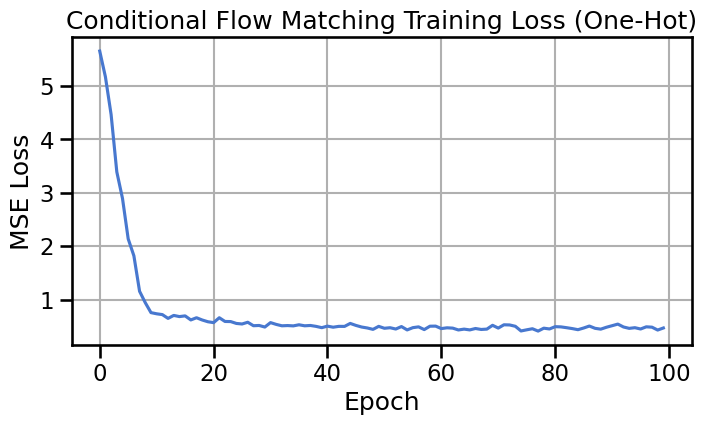

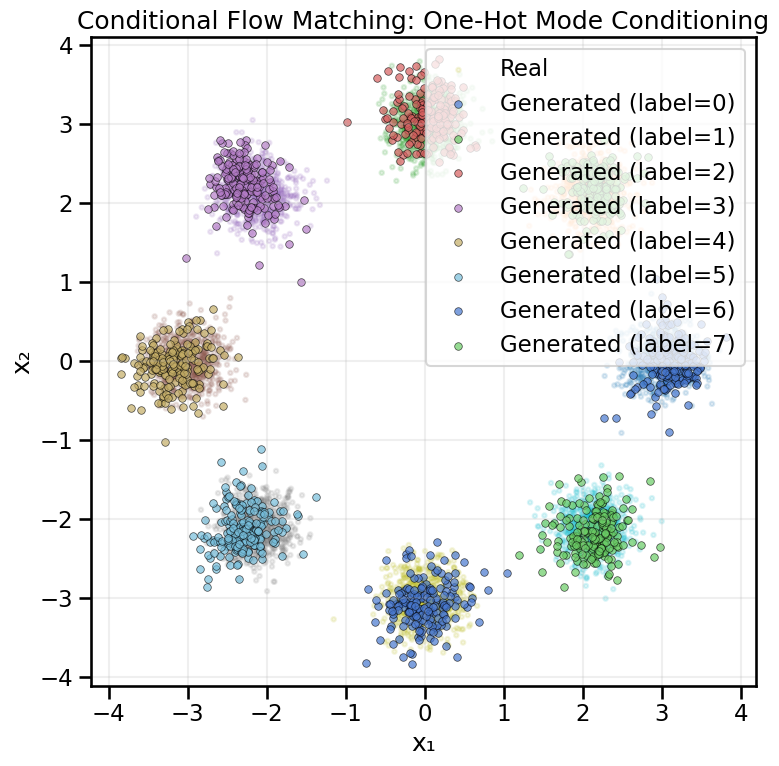

In [9]:
#| code-fold: false
# Train conditional model with one-hot encoding
model_onehot = train_conditional_flow_onehot(data = data, labels=labels,
                                             n_epochs=100, batch_size=128, lr=1e-3)

# Visualize results
visualize_conditional_samples_onehot(
    model_onehot, n_modes=8, n_samples_per_mode=200
)

By looking at the flow fields below, we can see how the conditioning label influences the direction and magnitude of the velocity vectors, guiding samples toward the desired mode in the ring of Gaussians example.

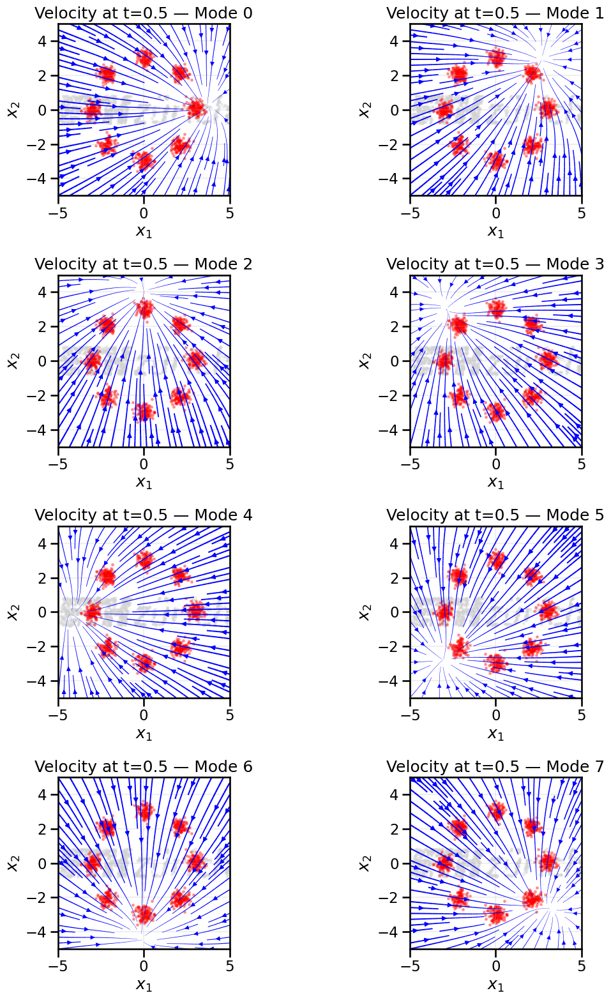

In [10]:
# Check the corresponding learned vector fields for each condition
n_classes = 8
xx, yy = np.meshgrid(np.linspace(-5, 5, 20), np.linspace(-5, 5, 20))
grid_points = torch.tensor(np.stack([xx.ravel(), yy.ravel()], axis=1), dtype=torch.float32, device=device)

# Create a 2-column, 4-row figure and plot each mode into a subplot
fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes = axes.ravel()

# Prepare base samples once (same as before)
if BASE_DISTRIBUTION == 'gaussian':
    base_samples = np.random.randn(1000, 2)
elif BASE_DISTRIBUTION == 'uniform':
    base_samples = np.random.rand(1000, 2) * 7.0 - 3.5
elif BASE_DISTRIBUTION == 'ethz_logo':
    base_samples = load_eth_z_logo_data(n_samples=1000)

for mode_idx in range(n_classes):
    ax = axes[mode_idx]
    condition = torch.zeros(1, n_classes, device=device)
    condition[0, mode_idx] = 1.0
    c_grid = condition.repeat(grid_points.shape[0], 1)

    # Get the velocity at each grid point at time t=0.5
    t_grid = torch.full((grid_points.shape[0], 1), 0.5, device=device)

    flow_model.eval()
    with torch.no_grad():
        velocities = model_onehot(grid_points, t_grid, c_grid).cpu().numpy()

    # Background: base and data
    ax.scatter(base_samples[:, 0], base_samples[:, 1], s=5, color='lightgrey', alpha=0.3, label='Base Distribution')
    ax.scatter(data[:, 0], data[:, 1], s=5, color='red', alpha=0.3, label='Data Distribution')

    # Quiver replaced by streamlines for smoother visualization
    # Reshape predicted velocities back to the grid shape expected by streamplot
    U = velocities[:, 0].reshape(xx.shape)
    V = velocities[:, 1].reshape(xx.shape)

    # Compute speed for linewidth scaling (avoid div-by-zero)
    speed = np.sqrt(U**2 + V**2)
    max_speed = speed.max() if speed.max() > 0 else 1.0
    linewidths = 1.5 * (speed / max_speed + 0.1)  # add small offset so thin vectors are visible

    # Plot streamlines
    strm = ax.streamplot(
        xx, yy, U, V,
        color='blue',
        linewidth=linewidths,
        density=1.0,
        arrowsize=1.0,
        arrowstyle='-|>',
        maxlength=6.0
    )

    ax.set_title(f'Velocity at t=0.5 — Mode {mode_idx}')
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')
    ax.set_xlim(-5, 5)
    ax.set_ylim(-5, 5)
    ax.set_aspect('equal', adjustable='box')
    ax.grid(True, alpha=0.2)
    #ax.legend(loc='upper right')

# If there are any unused subplots (shouldn't be here for 8 modes) hide them
for i in range(n_classes, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

### Example 2: Conditioning on the Continuous Radius

In [11]:
#| code-fold: false
class ConditionalVelocityFieldRadius(nn.Module):
    """Velocity field conditioned on continuous radius values."""

    def __init__(self, time_emb_dim=16, radius_emb_dim=16, hidden_dim=128):
        super().__init__()
        self.time_mlp = nn.Sequential(
            nn.Linear(1, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU(),
            nn.Linear(time_emb_dim, time_emb_dim),
        )
        self.radius_mlp = nn.Sequential(
            nn.Linear(1, radius_emb_dim),
            nn.ReLU(),
            nn.Linear(radius_emb_dim, radius_emb_dim),
            nn.ReLU(),
            nn.Linear(radius_emb_dim, radius_emb_dim),
        )
        # Concatenate: x (2) + time_emb + radius_emb
        self.net = nn.Sequential(
            nn.Linear(2 + time_emb_dim + radius_emb_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2),
        )

    def forward(self, x, t, r):
        """
        Args:
            x: [batch, 2] - spatial coordinates
            t: [batch, 1] - time
            r: [batch, 1] - radius values
        """
        t_emb = self.time_mlp(t)
        r_emb = self.radius_mlp(r)
        x_in = torch.cat([x, t_emb, r_emb], dim=-1)
        return self.net(x_in)


def train_conditional_flow_radius(data, n_epochs=500, batch_size=128, lr=1e-3):
    """Train the conditional velocity field with radius conditioning.
    """
    # if data is None:
    #     data, _ = create_ring_gaussians(n_samples=5000)

    # Create conditional data loader with radius
    radius_loader = make_conditional_loader_radius(data=data, batch_size=batch_size)

    # Model and optimizer
    model = ConditionalVelocityFieldRadius().to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr)

    # Training loop
    losses = []
    for epoch in range(n_epochs):
        epoch_loss = 0.0
        n_batches = 0
        for x1_batch, radius_batch in radius_loader:
            x1 = x1_batch.to(device)
            r = radius_batch.to(device)

            # Sample noise
            x0 = torch.randn_like(x1)

            # Sample time
            t = torch.rand(x1.shape[0], 1, device=device)

            # Interpolate
            xt = (1 - t) * x0 + t * x1

            # Compute target velocity
            target_v = x1 - x0

            # Predict velocity with radius conditioning
            predicted_v = model(xt, t, r)

            # Compute loss
            loss = nn.functional.mse_loss(predicted_v, target_v)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            epoch_loss += loss.item()
            n_batches += 1

        avg_loss = epoch_loss / n_batches
        losses.append(avg_loss)

        if epoch % 50 == 0:
            print(f"Epoch {epoch}, Loss: {avg_loss:.4f}")

    print("Conditional training with radius complete.")

    # Plot the loss curve
    plt.figure(figsize=(8, 4))
    plt.plot(range(n_epochs), losses)
    plt.title("Conditional Flow Matching Training Loss (Radius)")
    plt.xlabel("Epoch")
    plt.ylabel("MSE Loss")
    plt.grid(True)
    plt.show()

    return model


@torch.no_grad()
def sample_conditional_flow_radius(model, radius_value, n_samples=100, n_steps=100):
    """Generate samples using conditional flow matching with radius conditioning.

    Args:
        model: Conditional velocity field model
        radius_value: Scalar radius value to condition on
        n_samples: Number of samples to generate
        n_steps: Number of ODE integration steps
    """
    model.eval()

    # Start with pure noise
    x = torch.randn(n_samples, 2, device=device)

    # Create radius condition
    r = torch.full((n_samples, 1), radius_value, device=device)

    dt = 1.0 / n_steps

    for i in range(n_steps):
        t = torch.full((n_samples, 1), i / n_steps, device=device)
        v = model(x, t, r)
        x = x + v * dt

    return x.cpu().numpy()


def visualize_conditional_samples_radius(
    model, radius_values=None, n_samples_per_radius=200
):
    """Generate and visualize samples at different radius values."""

    if radius_values is None:
        radius_values = [1.0, 1.5, 2.0, 2.5, 3.0, 3.5]
    samples_by_value = {}
    for radius_val in radius_values:
        samples = sample_conditional_flow_radius(
            model, radius_val, n_samples=n_samples_per_radius
        )
        samples_by_value[float(radius_val)] = samples

    # Load real data for background
    real_data, _ = create_ring_gaussians(n_samples=5000)

    # Visualize
    plot_conditional_samples_continuous(
        samples_by_value,
        real_data=real_data,
        title="Conditional Flow Matching: Continuous Radius Conditioning",
    )


Epoch 0, Loss: 5.5464
Epoch 50, Loss: 3.0524
Epoch 100, Loss: 2.7391
Epoch 150, Loss: 2.6528
Epoch 200, Loss: 2.8269
Epoch 250, Loss: 2.7486
Conditional training with radius complete.


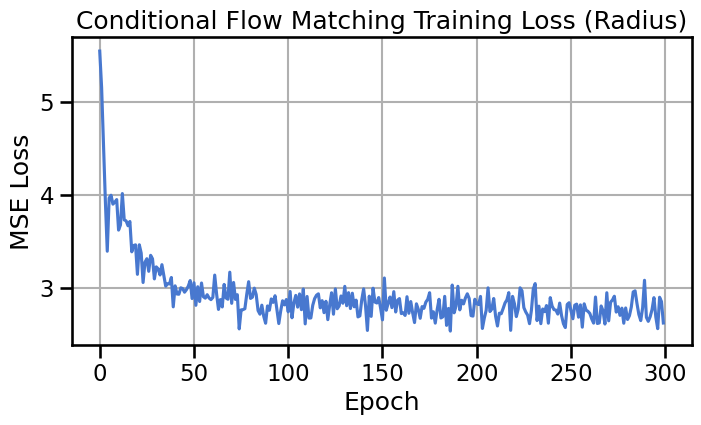

In [19]:
# Train conditional model with radius
model_radius = train_conditional_flow_radius(data=data,n_epochs=300, batch_size=128, lr=1e-3)


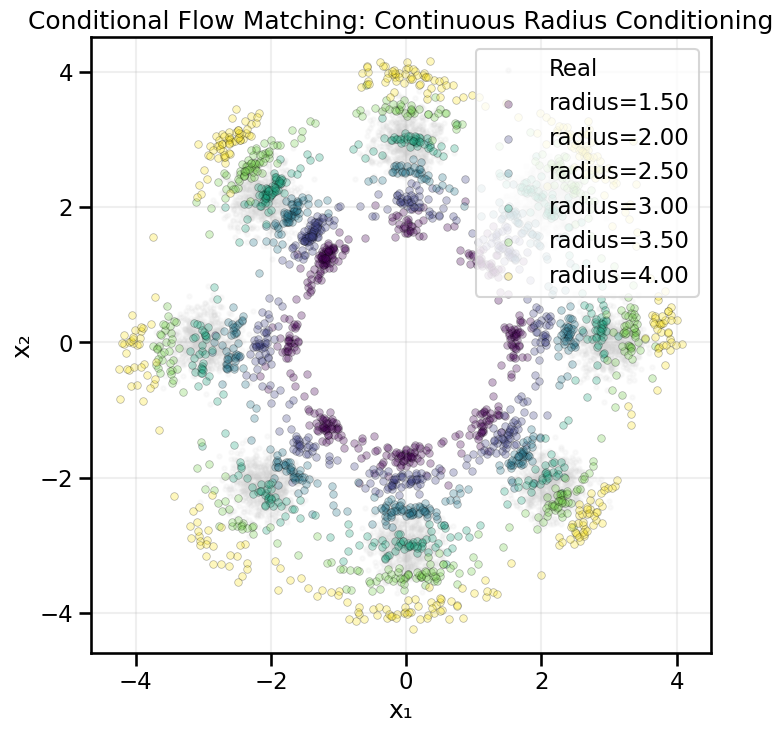

In [20]:

# Visualize results
visualize_conditional_samples_radius(
    model_radius,
    radius_values=[1.5, 2.0, 2.5, 3.0, 3.5, 4.0],
    n_samples_per_radius=400,
)

## Summary and Next Steps

Flow Matching combines some of the best aspects of both Normalizing Flows and Diffusion Models:

| Aspect                  | Diffusion Models        | Normalizing Flows (CNF) | Flow Matching           |
|-------------------------|-------------------------|-------------------------|-------------------------|
| **Dynamics**            | Stochastic (SDE)        | Deterministic (ODE)     | Deterministic (ODE)     |
| **Training**            | Score/Noise Regression  | Max Likelihood (trace)  | Velocity Regression     |
| **Path**                | Random, noisy           | Invertible, complex     | Simple, straight-line   |
| **Sampling Speed**      | Slow (many steps)       | Fast (single pass)      | Fast (few ODE steps)    |
| **Stability**           | Very stable             | Can be unstable         | Very stable             |

Flow Matching avoids the expensive trace computation of CNFs and the slow, stochastic sampling of diffusion models. It provides a stable, efficient, and conceptually simple way to learn a generative model.

-   **Flow Matching vs. Diffusion:** Flow Matching learns a deterministic ODE, while diffusion models learn to reverse a stochastic SDE. This leads to faster, noise-free sampling.
-   **Simple Training:** The model is trained by regressing a time-conditional neural network on the simple velocity vector defined by a straight-line path between noise and data samples.
-   **ODE-based Generation:** Samples are generated by integrating the learned velocity field from $t=0$ to $t=1$ using a numerical ODE solver.

Through this part of the book we have covered a wide variety of generative models, ranging from GANs to VAEs, Normalizing Flows, Diffusion Models, and now Flow Matching. Yet many of these models struggle in high-dimensional settings. A popular and commonly used approach is to combine these Generative Models with reduced or latent dimensional representations, such as those learned by Autoencoders or Variational Autoencoders. In the next chapter we will see how to combine these two threads together to produce "Latent Generative Models", such as Latent Diffusion Models or Latent Flow Models, which leverage the strengths of both generative modeling and representation learning.